In [1]:
import numpy as np
import pandas as pd
import random as rn
import time
import gc
import string
import warnings

In [2]:
seed = 100
np.random.seed(seed)
rn.seed(seed)

In [3]:
import tensorflow as tf

In [4]:
session_conf = tf.ConfigProto(intra_op_parallelism_threads = 1,
                              inter_op_parallelism_threads = 1)

In [5]:
tf.set_random_seed(seed)

In [6]:
sess = tf.Session(graph = tf.get_default_graph(), config = session_conf)

In [7]:
from keras import backend as K
K.set_session(sess)

Using TensorFlow backend.


In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords

In [10]:
warnings.filterwarnings("ignore")
%matplotlib inline

In [11]:
train = pd.read_csv("data/Quora_train.csv")
test = pd.read_csv("data/Quora_test.csv")

In [12]:
sincere = train[train["target"] == 0]
insincere = train[train["target"] == 1]

In [13]:
print(sincere.shape)
print(insincere.shape)

(1225312, 3)
(80810, 3)


In [14]:
train = pd.concat([sincere[:int(len(sincere)*0.9)], insincere[:int(len(insincere)*0.9)]])
val = pd.concat([sincere[int(len(sincere)*0.9):], insincere[int(len(insincere)*0.9):]])

In [15]:
tfidf_vc = TfidfVectorizer(min_df = 10,
                          max_features = 100000,
                          analyzer = "word",
                          ngram_range = (1, 2),
                          stop_words = "english",
                          lowercase = True)

In [16]:
train_vc = tfidf_vc.fit_transform(train["question_text"])
val_vc = tfidf_vc.transform(val["question_text"])

In [17]:
model = LogisticRegression(C = 0.5, solver = "sag")
model = model.fit(train_vc, train.target)
val_pred = model.predict(val_vc)

In [18]:
from sklearn.metrics import f1_score

In [19]:
val_cv = f1_score(val.target, val_pred, average = "binary")
print(val_cv)

0.463941128373


In [20]:
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
from lime import submodular_pick
from collections import OrderedDict

In [21]:
idx = val.index[32]
c = make_pipeline(tfidf_vc, model)
class_names = ["sincere", "insincere"]
explainer = LimeTextExplainer(class_names = class_names)
exp = explainer.explain_instance(val["question_text"][idx], c.predict_proba, num_features = 50)

In [22]:
print("Question: \n", val["question_text"][idx])
print("Probability (Insincere) =", c.predict_proba([val["question_text"][idx]])[0, 1])
print("True Class is:", class_names[val["target"][idx]])

Question: 
 What is the most critical topic in software engineering?
Probability (Insincere) = 0.00205584474926
True Class is: sincere


In [23]:
exp.show_in_notebook()

In [24]:
weights = OrderedDict(exp.as_list())
lime_weights = pd.DataFrame({"words": list(weights.keys()), 
                             "weights": list(weights.values())})

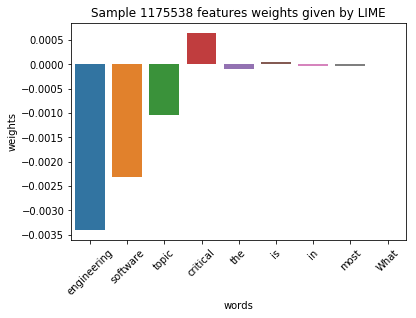

In [25]:
sns.barplot(x = "words", y = "weights", data = lime_weights)
plt.xticks(rotation = 45)
plt.title("Sample {} features weights given by LIME".format(idx))
plt.show()

In [26]:
sp_obj = submodular_pick.SubmodularPick(explainer, val["question_text"].values, 
                                        c.predict_proba, sample_size = 10, 
                                        num_features = 50, num_exps_desired = 6,
                                        top_labels = 3)

[<Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>]

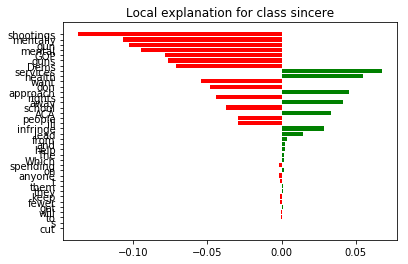

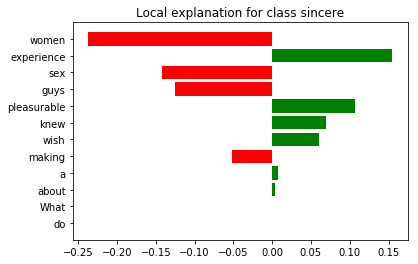

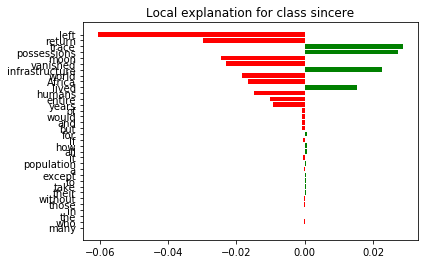

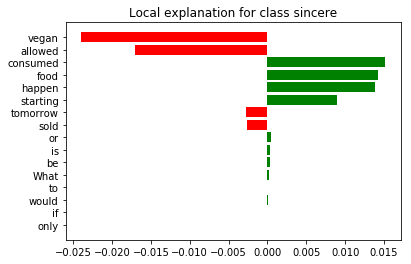

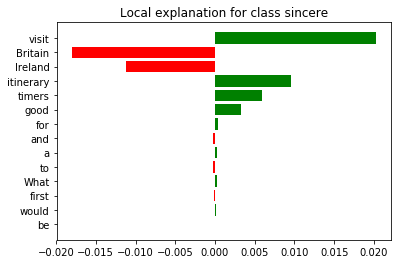

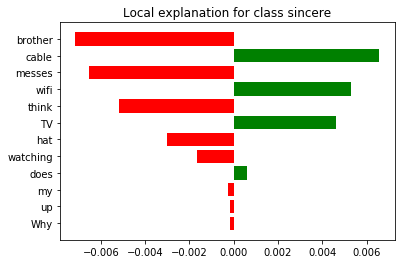

In [27]:
[exp.as_pyplot_figure(label = 0) for exp in sp_obj.sp_explanations]

In [28]:
from keras.layers import Input, Embedding, Dense, Conv1D, MaxPool1D, BatchNormalization
from keras.layers import Flatten, Concatenate, Dropout, SpatialDropout1D
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model

In [29]:
EMBEDDING_FILE = 'data/glove.42B.300d.txt'

In [30]:
max_features = 50000
max_len = 70
embed_size = 300

In [31]:
X_train, y_train = train["question_text"], train["target"]
X_val, y_val = val["question_text"], val["target"]

In [32]:
tk = Tokenizer(num_words = max_features)
tk.fit_on_texts(X_train)
# X_train = tk.texts_to_sequences(X_train)
# X_val = tk.texts_to_sequences(X_val)
# X_train = pad_sequences(X_train, maxlen = max_len)
# X_val = pad_sequences(X_val, maxlen = max_len)

In [33]:
from sklearn.pipeline import TransformerMixin
from sklearn.base import BaseEstimator

In [34]:
class TextsToSequences(Tokenizer, BaseEstimator, TransformerMixin):
    """ Sklearn transformer to convert texts to indices list 
    (e.g. [["the cute cat"], ["the dog"]] -> [[1, 2, 3], [1, 4]])"""
    def __init__(self,  **kwargs):
        super().__init__(**kwargs)
        
    def fit(self, texts, y=None):
        self.fit_on_texts(texts)
        return self
    
    def transform(self, texts, y=None):
        return np.array(self.texts_to_sequences(texts))

In [35]:
sequencer = TextsToSequences(num_words = max_features)

In [36]:
class Padder(BaseEstimator, TransformerMixin):
    """ Pad and crop uneven lists to the same length. 
    Only the end of lists longernthan the maxlen attribute are
    kept, and lists shorter than maxlen are left-padded with zeros
    
    Attributes
    ----------
    maxlen: int
        sizes of sequences after padding
    max_index: int
        maximum index known by the Padder, if a higher index is met during 
        transform it is transformed to a 0
    """
    def __init__(self, maxlen=500):
        self.maxlen = maxlen
        self.max_index = None
        
    def fit(self, X, y=None):
        self.max_index = pad_sequences(X, maxlen=self.maxlen).max()
        return self
    
    def transform(self, X, y=None):
        X = pad_sequences(X, maxlen=self.maxlen)
        X[X > self.max_index] = 0
        return X

In [37]:
padder = Padder(max_len)

In [40]:
def get_coefs(word, *arr): return word, np.asarray(arr, dtype='float32')

In [42]:
embeddings_index = dict(get_coefs(*o.rstrip().rsplit(' ')) for o in open(EMBEDDING_FILE,encoding="utf8"))

In [43]:
word_index = tk.word_index
nb_words = min(max_features, len(word_index))
embedding_matrix = np.zeros((nb_words, embed_size))
for word, i in word_index.items():
    if i >= max_features: continue
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None: embedding_matrix[i] = embedding_vector

In [44]:
from keras.callbacks import Callback

In [45]:
class F1Evaluation(Callback):
    def __init__(self, validation_data=(), interval=1):
        super(Callback, self).__init__()

        self.interval = interval
        self.X_val, self.y_val = validation_data

    def on_epoch_end(self, epoch, logs={}):
        if epoch % self.interval == 0:
            y_pred = self.model.predict(self.X_val, verbose=0)
            y_pred = (y_pred > 0.35).astype(int)
            score = f1_score(self.y_val, y_pred)
            print("\n F1 Score - epoch: %d - score: %.6f \n" % (epoch+1, score))

In [46]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.pipeline import make_pipeline

In [47]:
def build_model():
    inp = Input(shape = (max_len,))
    x = Embedding(max_features, embed_size, weights = [embedding_matrix])(inp)
    x = SpatialDropout1D(0.5)(x)
    x = Conv1D(32, kernel_size = 2, activation = "relu")(x)
    x = Conv1D(32, kernel_size = 2, activation = "relu")(x)
    x = MaxPool1D(pool_size = 3)(x)
    
    x = Flatten()(x)
    x = BatchNormalization()(x)
    out = Dense(1, activation = "sigmoid")(x)
    
    model = Model(inputs = inp, outputs = out)
    model.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = ["accuracy"])
    
    return model

In [48]:
batch_size = 512
sklearn_cnn = KerasClassifier(build_fn = build_model, epochs = 5, 
                              batch_size = batch_size, verbose = 2)

In [49]:
pipeline = make_pipeline(sequencer, padder, sklearn_cnn)
pipeline.fit(X_train, y_train)

Epoch 1/5
 - 4529s - loss: 0.1499 - acc: 0.9459
Epoch 2/5
 - 4218s - loss: 0.1274 - acc: 0.9520
Epoch 3/5
 - 3694s - loss: 0.1208 - acc: 0.9544
Epoch 4/5
 - 3851s - loss: 0.1161 - acc: 0.9560
Epoch 5/5
 - 3866s - loss: 0.1121 - acc: 0.9574


Pipeline(memory=None,
     steps=[('textstosequences', TextsToSequences()), ('padder', Padder(maxlen=70)), ('kerasclassifier', <keras.wrappers.scikit_learn.KerasClassifier object at 0x000000010C99B3C8>)])

In [50]:
val_pred = pipeline.predict(X_val)
val_cv = f1_score(y_val, val_pred, average = "binary")
print("Local CV is {}".format(val_cv))

Local CV is 0.5209477483131963


In [51]:
sp_obj = submodular_pick.SubmodularPick(explainer, val["question_text"].values, 
                                        pipeline.predict_proba, sample_size = 10, 
                                        num_features = 100, num_exps_desired = 6,
                                        top_labels = 3)

[<Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>,
 <Figure size 432x288 with 1 Axes>]

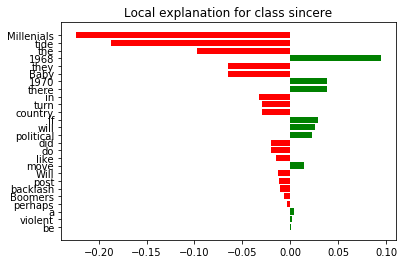

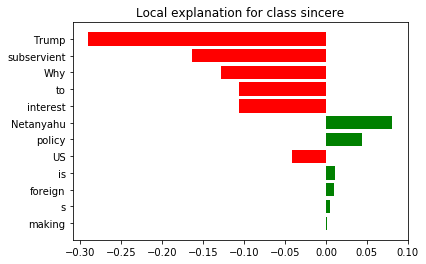

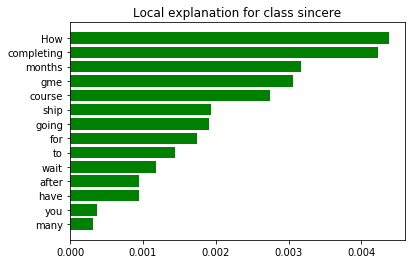

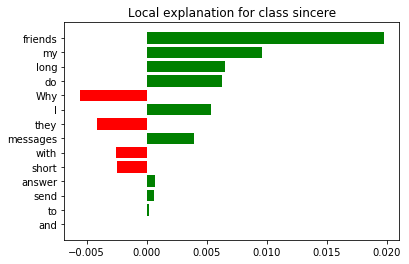

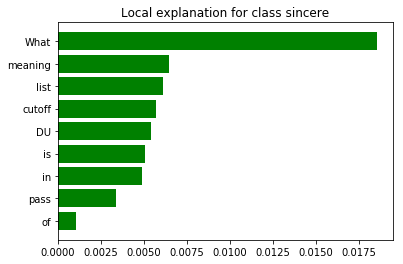

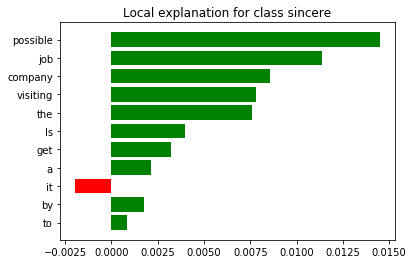

In [52]:
[exp.as_pyplot_figure(label = 0) for exp in sp_obj.sp_explanations]

In [53]:
def explain(idx):
    print("Sample question:\n", X_val.iloc[idx])
    print("-"*50)
    print("Probability (Insincere): {}".format(pipeline.predict_proba([X_val.iloc[idx]])[0, 1]))
    print("True Class is {}".format(class_names[y_val.iloc[idx]]))
    explanation = explainer.explain_instance(X_val.iloc[idx], pipeline.predict_proba, 
                                             num_features = 20)
    explanation.show_in_notebook()
    weights = OrderedDict(explanation.as_list())
    lime_weights = pd.DataFrame({"words": list(weights.keys()), 
                                 "weights": list(weights.values())})

    sns.barplot(x = "words", y = "weights", data = lime_weights)
    plt.xticks(rotation = 45)
    plt.title("Sample {} features weights given by LIME".format(idx))
    plt.show()

Sample question:
 What is the meaning of redistribution of energy in a system?
--------------------------------------------------
Probability (Insincere): 0.0003078487061429769
True Class is sincere


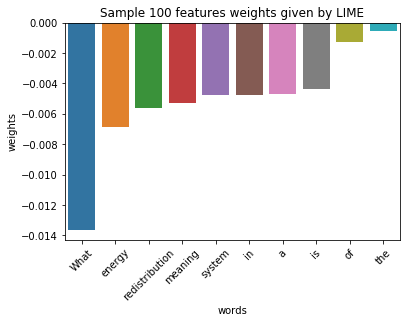

In [54]:
explain(100)

In [55]:
Class = pd.DataFrame({"true": y_val}).reset_index()
Class["pred"] = val_pred

Sample question:
 Why are so many feminists on Quora so mean about “Nice Guys” when “Nice Guys” are just exhibiting a signs of a type of trauma that they need to be helped and encouraged to overcome instead of being attacked?
--------------------------------------------------
Probability (Insincere): 0.6128786206245422
True Class is insincere


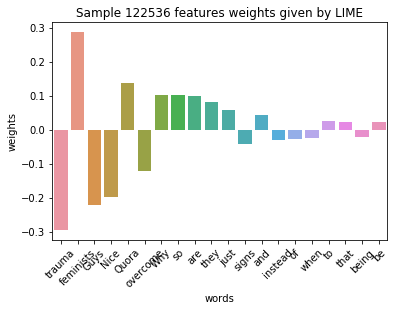

In [56]:
temp = Class[(Class["true"] == 1) & (Class["pred"] > 0.5)]
explain(temp.index[0])

Sample question:
 Do South Koreans look down on Chinese Indonesians today?
--------------------------------------------------
Probability (Insincere): 0.3553624749183655
True Class is insincere


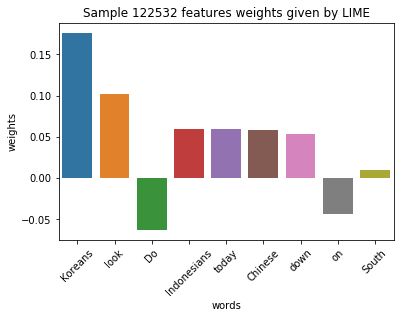

In [57]:
temp = Class[(Class["true"] == 1) & (Class["pred"] < 0.5)]
explain(temp.index[0])

Sample question:
 How would society be different if our repressed childhood memories were "unlocked" on our 21st birthdays?
--------------------------------------------------
Probability (Insincere): 0.002107759239152074
True Class is sincere


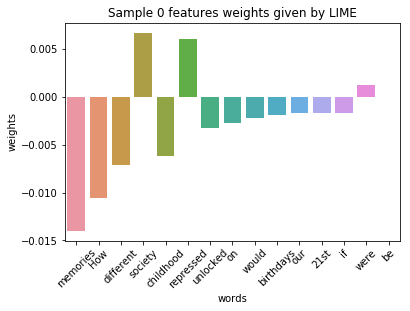

In [58]:
temp = Class[(Class["true"] == 0) & (Class["pred"] < 0.5)]
explain(temp.index[0])

Sample question:
 Why do Christian-conservative Americans call abortion murder?
--------------------------------------------------
Probability (Insincere): 0.6329264640808105
True Class is sincere


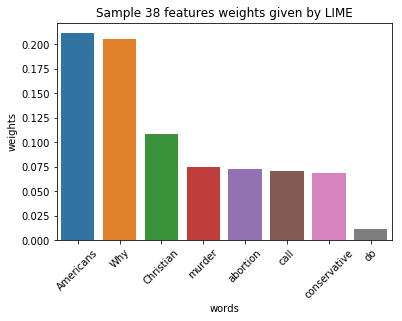

In [59]:
temp = Class[(Class["true"] == 0) & (Class["pred"] > 0.5)]
explain(temp.index[0])